In [1]:
from panel_segmentation import utils
import glob
import matplotlib.pyplot as plt
from PIL import Image
import os
import pandas as pd
import folium
import torch
from mmengine import Config
from mmdet.apis import init_detector, inference_detector
from mmdet.registry import VISUALIZERS
from shapely.geometry import Polygon
import mmcv

# Only flag for single warning if there are repeats
import warnings
warnings.filterwarnings(action='once')

In [2]:
zoom_level = 19
file_save_folder = "../panel_segmentation/examples/sol-searcher_data_examples"

C:\Users\Quyen\Documents\all_venv\panel_seg_extreme_weather\Lib\site-packages\mmcv\cnn\bricks\transformer.py:24: ImportWarning: ``MultiScaleDeformableAttention`` has been moved to ``mmcv.ops.multi_scale_deform_attn``, please change original path ``from mmcv.cnn.bricks.transformer import MultiScaleDeformableAttention`` to ``from mmcv.ops.multi_scale_deform_attn import MultiScaleDeformableAttention`` 
  warnings.warn(
C:\Users\Quyen\Documents\all_venv\panel_seg_extreme_weather\Lib\site-packages\mmdet\apis\inference.py:70: UserWarning: checkpoint is None, use COCO classes by default.
  warnings.warn('checkpoint is None, use COCO classes by default.')
C:\Users\Quyen\Documents\all_venv\panel_seg_extreme_weather\Lib\site-packages\mmdet\models\layers\se_layer.py:158: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
C:\Users\Quyen\Documents\all_venv\panel_seg_extreme_weather

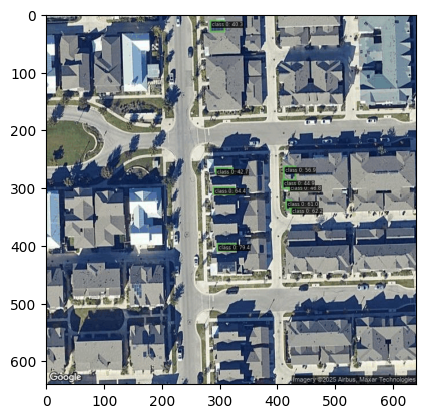

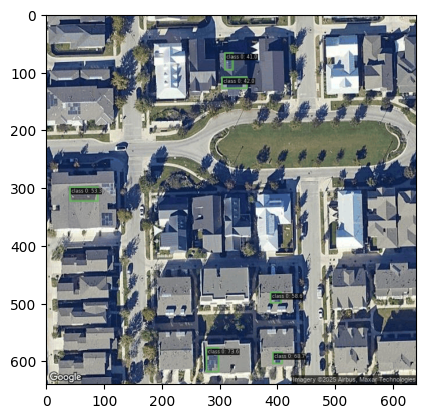

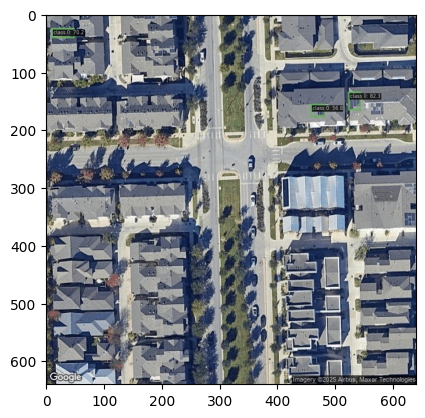

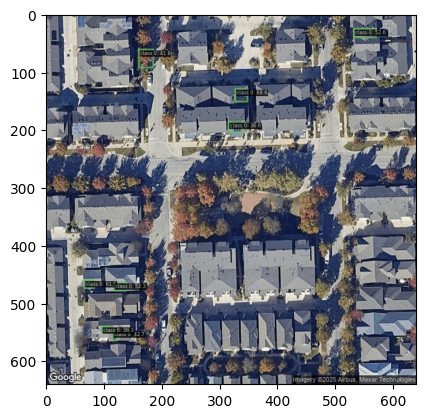

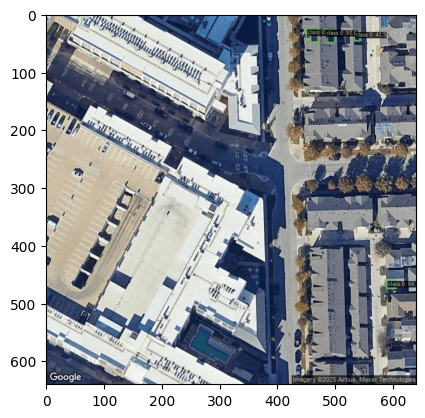

...

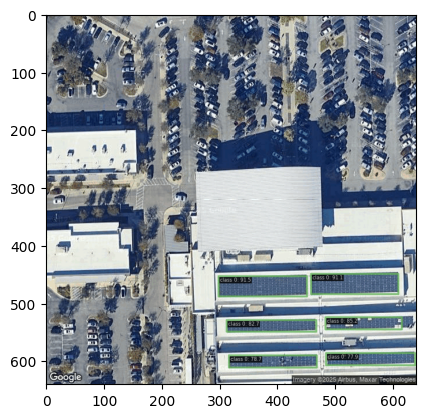

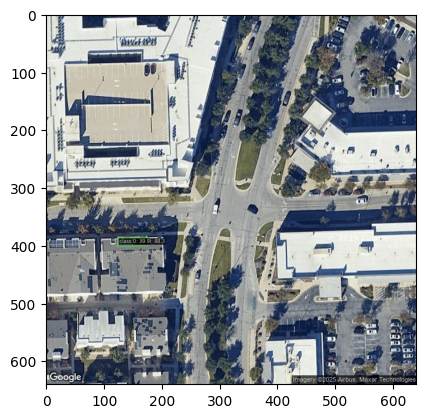

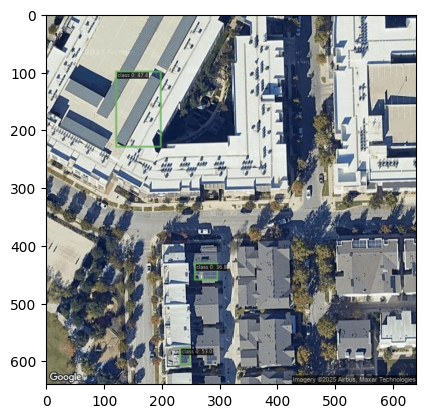

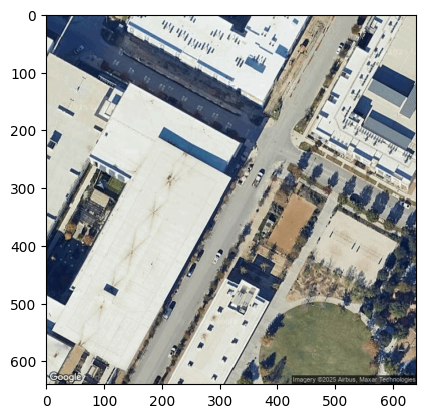

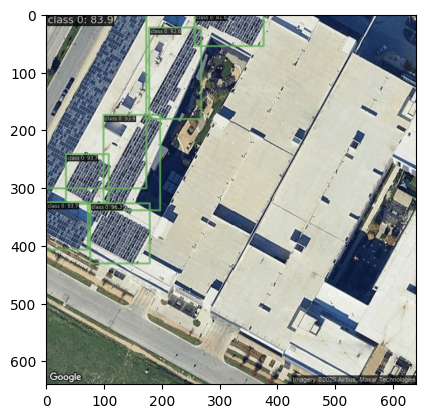

C:\Users\Quyen\Documents\all_venv\panel_seg_extreme_weather\Lib\site-packages\mmengine\visualization\visualizer.py:760: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
C:\Users\Quyen\Documents\all_venv\panel_seg_extreme_weather\Lib\site-packages\mmengine\visualization\visualizer.py:831: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(


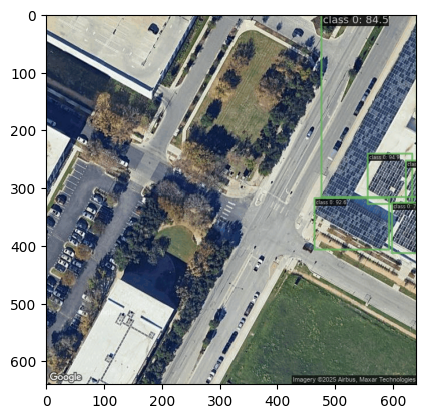

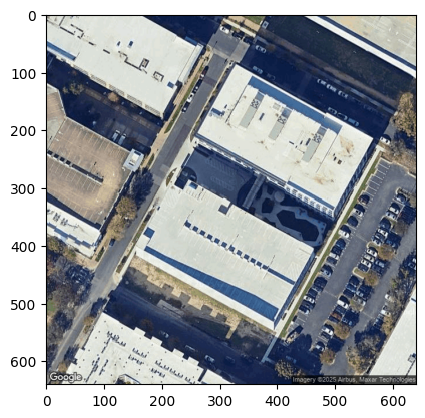

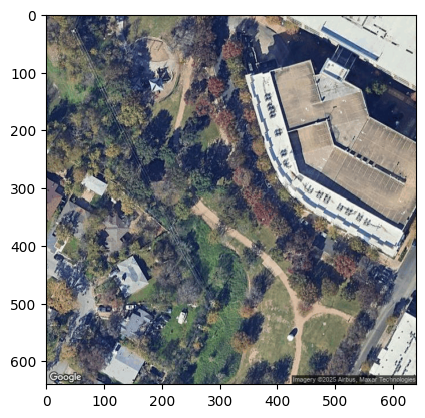

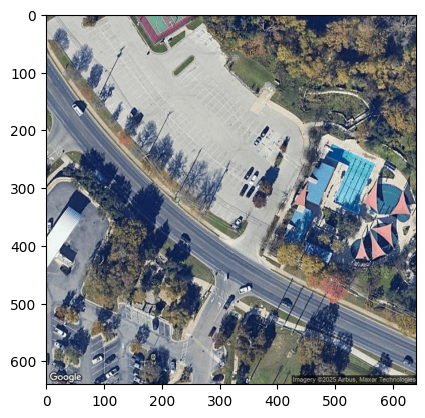

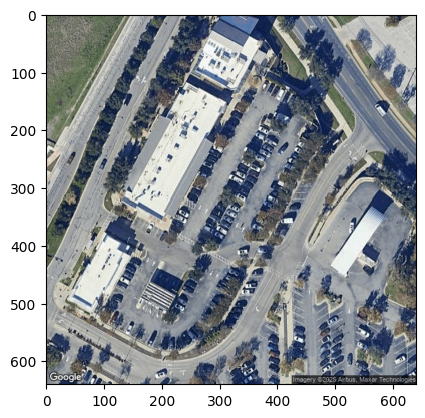

...

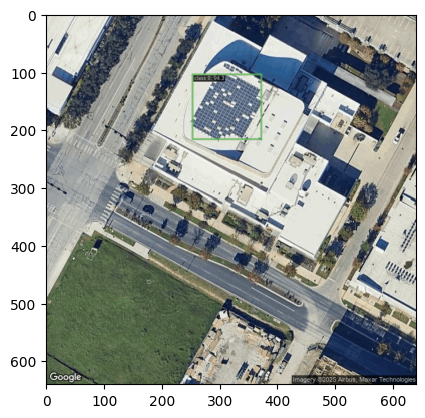

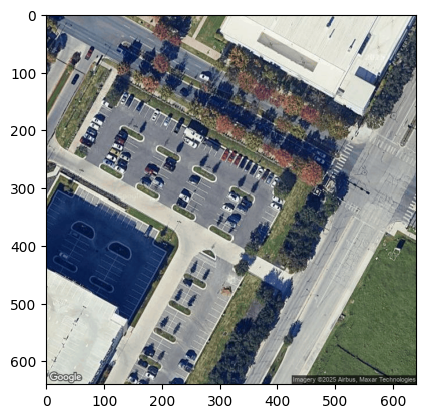

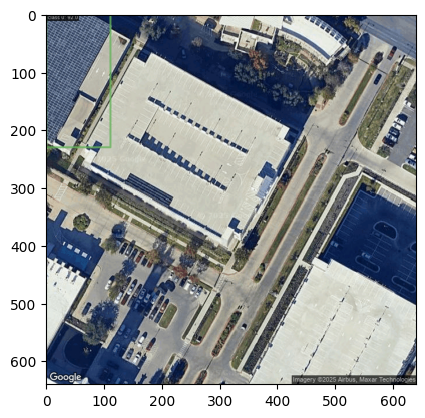

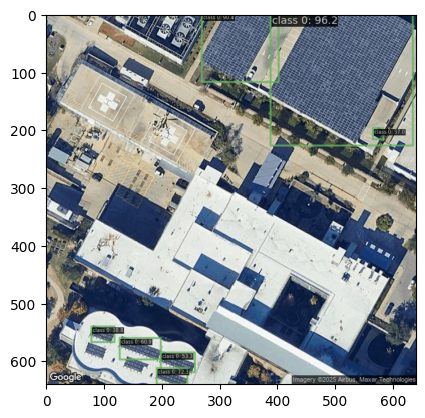

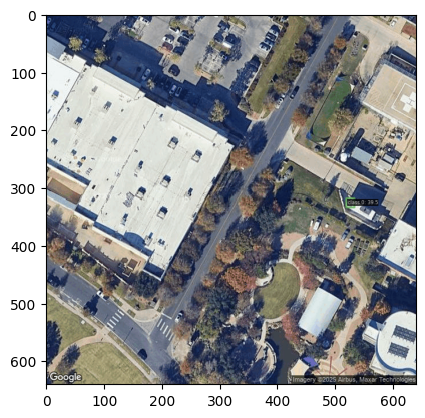

In [3]:
cfg = Config.fromfile("./models/rtmdet-x.py")
checkpoint_file = "./models/rtmdet-x.pth"
model = init_detector(cfg, device='cpu')
checkpoint = torch.load(checkpoint_file, map_location='cpu', weights_only=False)
model.load_state_dict(checkpoint['state_dict'])
visualizer = VISUALIZERS.build(model.cfg.visualizer)

grid_files = glob.glob(os.path.join(file_save_folder, "*.png"))
# Run inference on the example images
inference_data_list = list()
results = list()
for file in grid_files:
    img = mmcv.imread(file, channel_order='rgb')
    new_result = inference_detector(model, img)
    visualizer.add_datasample(
          file,
          img,
          data_sample=new_result,
          draw_gt=None,
          wait_time=0,
          pred_score_thr=0.35
          )
    img = visualizer.get_image()
    plt.imshow(img)
    plt.show()
    plt.close()
    new_result.file = file
    results.append(new_result)